# Assignment 2

# Task 1: Data Collection and Preprocessing (4 Marks)

## 1.1 Load Data

- **Objective**: Load the California Housing dataset using `sklearn.datasets.fetch_california_housing`.
- **Steps**:
  1. Import necessary libraries.
  2. Load the dataset and create a DataFrame.
  3. Check the dataset shape, column names, and missing values.

In [1]:
# Import necessary libraries
import pandas as pd
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Load the dataset
housing = fetch_california_housing(as_frame=True)
df = housing.frame

# Check dataset shape and column names
rows, cols = df.shape
print(f"The dataset contains {rows} rows and {cols} columns.\n")
print(f"Column names: {list(df.columns)}\n")

# Check for missing values
print("Missing values summary:\n", df.isnull().sum())

The dataset contains 20640 rows and 9 columns.

Column names: ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude', 'MedHouseVal']

Missing values summary:
 MedInc         0
HouseAge       0
AveRooms       0
AveBedrms      0
Population     0
AveOccup       0
Latitude       0
Longitude      0
MedHouseVal    0
dtype: int64


## 1.2 Feature Engineering

- Create new features, such as an interaction term between columns (`Rooms_per_House`).

In [2]:
# Feature engineering: Adding an interaction term
df['Rooms_per_House'] = df['AveRooms'] / df['HouseAge']

## 1.3 Scaling/Normalization

- Apply `StandardScaler` to scale the features for better model performance.

In [3]:
# Data scaling
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

# Define features (X) and target (y)
X = df_scaled.drop('MedHouseVal', axis=1)
y = df_scaled['MedHouseVal']

# Split dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## 1.4 AutoEDA with Pandas Profiling

- Generate an automated exploratory data analysis (EDA) report using Pandas Profiling.

In [4]:
# Import pandas profiling
from ydata_profiling import ProfileReport

# Generate Pandas Profiling Report and display inline
profile = ProfileReport(df, title="California Housing Profiling Report", explorative=True)
profile.to_notebook_iframe()

# Save report as HTML
profile.to_file("california_housing_profile_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Add a heatmap

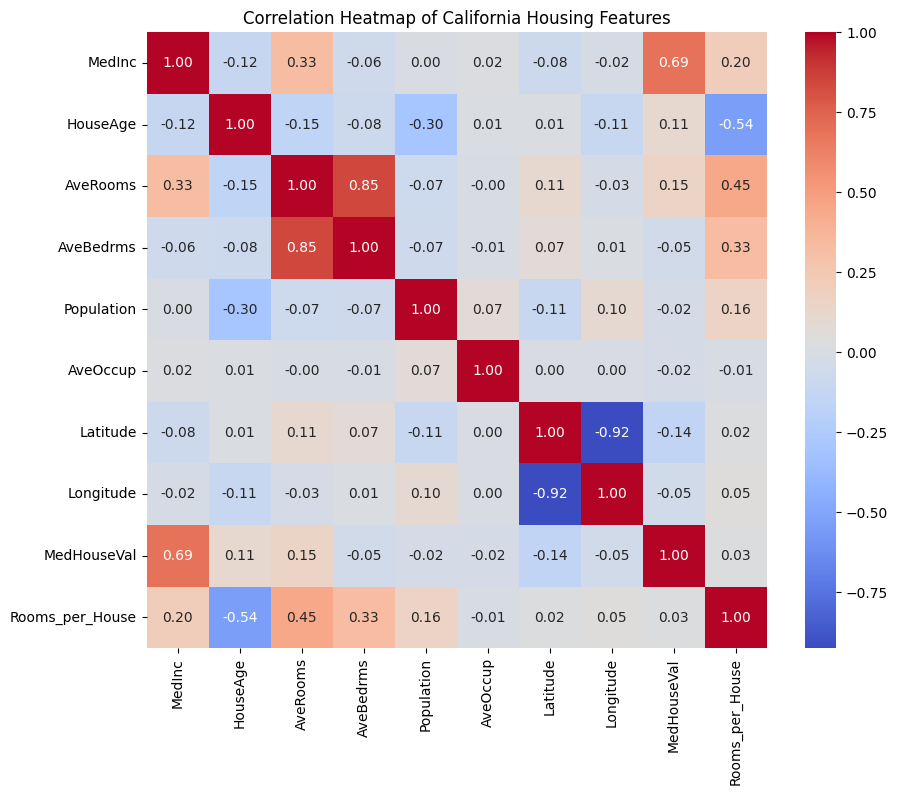

In [12]:
import seaborn as sns

# Calculate the correlation matrix
corr_matrix = df.corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Heatmap of California Housing Features")
plt.show()

### Correlation Heatmap for California Housing Features

The heatmap visualizes the correlation matrix of features in the California Housing dataset. Each cell in the heatmap represents the Pearson correlation coefficient between two features, indicating the linear relationship between them.

#### Key Observations:

1. **`MedInc` (Median Income)**:
   - `MedInc` shows a **strong positive correlation** (+0.69) with the target variable `MedHouseVal` (Median House Value). This suggests that as the median income increases, the housing prices tend to increase as well.
   - `MedInc` also has moderate positive correlations with `AveRooms` (+0.33) and `Rooms_per_House` (+0.20), indicating that wealthier households may tend to have larger homes.

2. **`HouseAge`**:
   - `HouseAge` has a **moderate negative correlation** (-0.54) with `Rooms_per_House`. This implies that older houses tend to have fewer rooms on average relative to their age.
   - The correlation between `HouseAge` and `MedHouseVal` is relatively weak (+0.11), indicating that house age does not have a very strong linear relationship with housing prices.

3. **`AveRooms` (Average Rooms)**:
   - `AveRooms` has a **strong positive correlation** (+0.85) with `AveBedrms` (Average Bedrooms), which is expected because houses with more rooms generally tend to have more bedrooms as well.
   - `AveRooms` also shows a slight positive correlation with `MedHouseVal` (+0.15), meaning houses with more rooms may slightly increase the house value, but this is not the most significant feature.

4. **`AveBedrms` (Average Bedrooms)**:
   - `AveBedrms` has a strong positive correlation with `AveRooms` (+0.85), as discussed above.
   - However, `AveBedrms` has almost no significant relationship with `MedHouseVal` (-0.05), suggesting that the number of bedrooms alone does not significantly affect house prices.

5. **`Latitude` and `Longitude`**:
   - `Latitude` and `Longitude` show a **strong negative correlation** (-0.92) with each other, which makes sense as these represent geographical coordinates, where movement along one axis (latitude) often leads to a corresponding decrease in the other axis (longitude) in specific geographic regions.
   - `Latitude` shows a slight negative correlation (-0.14) with `MedHouseVal`, indicating that houses located further north in California may have slightly lower prices, while `Longitude` has no significant correlation with house prices.

6. **`AveOccup` (Average Occupancy)**:
   - `AveOccup` has very weak correlations with other features, indicating it doesn't show a strong relationship with housing prices or other characteristics like house size.

7. **`Population`**:
   - `Population` has weak correlations with all other features, including `MedHouseVal`, meaning the population size in an area does not have a significant linear relationship with housing prices.

8. **`Rooms_per_House`**:
   - `Rooms_per_House` shows a moderate positive correlation with `MedInc` (+0.20), indicating that wealthier areas may have more rooms relative to house age.
   - There is almost no significant correlation between `Rooms_per_House` and `MedHouseVal` (+0.03), suggesting that this feature does not greatly influence house prices.

#### Overall Insights:
- **`MedInc` (Median Income)** has the strongest linear relationship with house prices (`MedHouseVal`), which is expected as income levels are a key determinant of housing affordability and demand.
- Other features, such as **`AveRooms`** and **`HouseAge`**, have weaker but still notable relationships with house prices.
- **Geographical location** (Latitude and Longitude) also plays a role, albeit a relatively smaller one compared to income.
- Features like **`AveBedrms`**, **`Population`**, and **`AveOccup`** have little to no linear relationship with housing prices, suggesting they are less influential in determining the price.

This heatmap helps us identify the most impactful features for predicting house prices and highlights the key relationships between differet housing characteristics in the dataset.


# Task 2: Model Selection, Training, and Hyperparameter Tuning (6 Marks)

## 2.1 Model Selection

- Select the `RandomForestRegressor` model for housing price prediction.
- Split the dataset into training and testing sets.

In [5]:
from sklearn.ensemble import RandomForestRegressor

# Define the model
model = RandomForestRegressor()

## 2.2 Hyperparameter Tuning

- Perform hyperparameter tuning using `GridSearchCV` to find the best parameters for the model.

In [6]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

# Perform GridSearchCV
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# Get the best model
best_model = grid_search.best_estimator_
print("Best Model Parameters: ", grid_search.best_params_)

Fitting 3 folds for each of 16 candidates, totalling 48 fits
Best Model Parameters:  {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}


The hyperparameter tuning using GridSearchCV has identified the best parameters for the RandomForestRegressor model. The optimal model has a depth of 20 (`max_depth`), uses 100 trees (`n_estimators`), splits nodes with at least 5 samples (`min_samples_split`), and has a minimum of 2 samples per leaf (`min_samples_leaf`), improving the model’s performance by optimizing its complexity and fitting to the training data.


## 2.3 Model Evaluation

- Evaluate the model on the test set and report metrics like Mean Squared Error (MSE) and R² score.

In [7]:
# Evaluate on test set
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"R2 Score: {r2}")

Mean Squared Error: 0.19366642474666165
R2 Score: 0.8032090818445374


The model evaluation on the test set shows a **Mean Squared Error (MSE)** of 0.1937, indicating the average squared difference between the predicted and actual values is relatively low. The **R² Score** of 0.8032 suggests that the model explains approximately 80.32% of the variance in housing prices, indicating a good fit to the data.


# Task 3: Explainable AI (XAI) Implementation (6 Marks)

## 3.1 Apply SHAP for Model Interpretability

- Use SHAP (SHapley Additive exPlanations) to interpret the model’s predictions.
- Visualize feature importance using SHAP values.

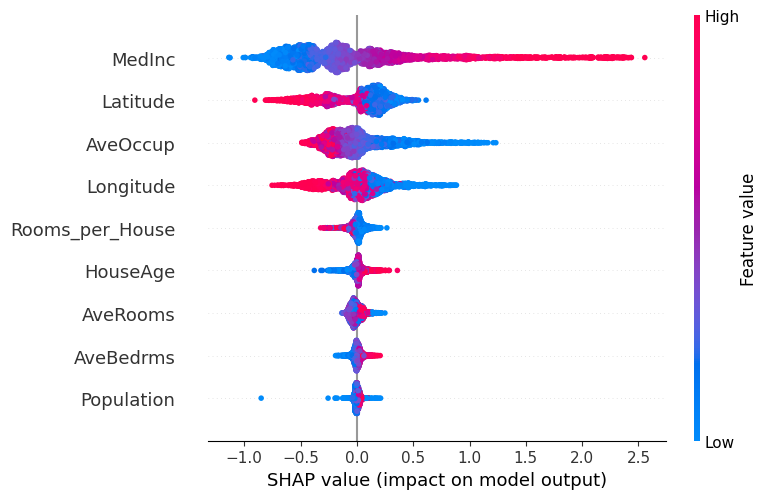

In [8]:
import shap
import matplotlib.pyplot as plt

# Use %matplotlib inline to ensure plots are rendered in the notebook
%matplotlib inline

# Initialize SHAP explainer
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)

# Visualize SHAP values for the first prediction
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0], X_test.iloc[0, :])

# SHAP summary plot to show feature importance
shap.summary_plot(shap_values, X_test, feature_names=X.columns)

# Show the plot explicitly
plt.show()

### SHAP Summary Plot for California Housing Dataset

The attached image displays a **SHAP summary plot**, which provides insights into how the features influence the predictions of the **RandomForestRegressor** model trained on the California Housing dataset.

#### Key Points:

- **X-axis (SHAP value)**: The SHAP value represents the impact a feature has on the model's output. A positive SHAP value indicates that the feature increases the predicted house price, whereas a negative SHAP value indicates a decrease in the predicted price.
  
- **Y-axis (Features)**: The features used in the model are listed along the Y-axis. The features are sorted by their importance, with the most important feature appearing at the top (in this case, `MedInc` or Median Income) and the least important feature at the bottom (in this case, `Population`).

- **Color Coding (Feature Value)**:
  - **Red** represents high feature values, while **blue** represents low feature values.
  - For example, red points for `MedInc` indicate higher values of median income, while blue points represent lower values of income.

#### Inferences:

1. **`MedInc` (Median Income)**:
   - This is the most significant feature influencing house prices. As shown by the distribution of SHAP values, higher values of `MedInc` (red points) are associated with increased housing prices, as indicated by the positive SHAP values.

2. **`Latitude` and `Longitude`**:
   - These features are also important in predicting house prices. Houses located at certain geographic coordinates (higher `Latitude` and `Longitude` values) have a noticeable impact on price predictions, suggesting that location significantly affects housing prices.

3. **`AveOccup` (Average Occupancy)**:
   - Higher average occupancy (red points) generally results in lower house prices, as indicated by the negative SHAP values. Lower occupancy (blue points) tends to increase house prices.

4. **`Rooms_per_House`**:
   - This interaction term represents the ratio of average rooms to house age. The plot indicates that a higher number of rooms relative to house age generally increases housing prices (as seen by the positive SHAP values for higher values of `Rooms_per_House`).

5. **`HouseAge` and `AveRooms`**:
   - These features also influence house prices. Older houses (`HouseAge`) with more rooms (`AveRooms`) contribute positively to higher prices in some cases, though the effect is less pronounced compared to features like `MedInc`.

6. **`AveBedrms` (Average Bedrooms)**:
   - The number of bedrooms per house does not have as large of an impact on housing prices as some of the other features, though higher values (indicated by red) tend to reduce housing prices slightly.

7. **`Population`**:
   - Population is the least influential feature in the model, with almost no substantial impact on the predictions as reflected by the relatively smaller SHAP values and less pronounced color differentiation.

#### Conclusion:

- The SHAP summary plot provides clear insights into the key factors driving housing prices in the California Housing dataset.
- **Median Income** (`MedInc`) is the most impactful feature, with higher incomes strongly associated with increased house prices.
- **Location** (`Latitude` and `Longitude`) also plays a crucial role, highlighting the geographic influence on housing prices.
- Other features like `Rooms_per_House` and `HouseAge` have more moderate effects on price predictions.
- Overall, the SHAP values help in understanding both the global importance of features and how each feature impacts individual predictions, thus makin the model's decisions more interpretable.


## 3.2 Apply LIME for Model Interpretability

- **Objective**: Use LIME (Local Interpretable Model-agnostic Explanations) to make individual predictions interpretable.
- **Steps**:
  1. Initialize LIME explainer and select an instance to explain.
  2. Use LIME to provide interpretable explanations for the model predictions.

In [9]:
import lime
import lime.lime_tabular

# Initialize LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=['MedHouseVal'], verbose=True, mode='regression')

# Explain a single instance (e.g., the first test instance)
exp = lime_explainer.explain_instance(X_test.iloc[0].values, best_model.predict, num_features=5)

# Show explanation
exp.show_in_notebook(show_table=True)

Intercept 0.48210572518454237
Prediction_local [-0.58635393]
Right: -1.3624135377788187


C:\Users\Aditya\anaconda3\envs\mlops2\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


### LIME Explanation for Model Interpretability

The LIME (Local Interpretable Model-agnostic Explanations) output provides an interpretable explanation of the **RandomForestRegressor** model’s prediction for a single test instance.

#### Key Points:
- **Intercept (0.482)**: This is the base prediction for the regression model without any feature influence, meaning that the model would predict approximately 0.482 (in normalized terms) without any features contributing.
  
- **Prediction Local (-0.586)**: This is the local prediction made by the model for this particular instance. The predicted value is -0.586, which is close to the actual value (Right: -1.362), showing that the model is reasonably accurate for this instance.

- **Feature Contributions**:
  - **Negative Contributions (decreasing predicted value)**:
    - `MedInc <= -0.69`: A low median income contributes the most (-0.77) to decreasing the prediction.
    - `Latitude` and `AveOccup` also contribute to decreasing the prediction, albeit to a lesser degree.
  
  - **Positive Contributions (increasing predicted value)**:
    - `Longitude > -1.12` and `Rooms_per_House > -0.39` contribute positively (though slightly) to increasing the predicted value.

#### Feature Importance:
- **`MedInc`** (Median Income) has the largest negative influence on the prediction. A very low income results in a significant reduction in the predicted house value.
- **Geographic factors** such as `Longitude` and `Latitude` also play a role in adjusting the prediction, though to a lesser degree.
- **`Rooms_per_House`** has a small positive impact on the prediction, indicating that houses with more rooms relative to their age contribute slightly to increasing house prices.

#### Summary:
The LIME explanation shows that for this instance, the **low median income** is the dominant factor driving the predicted house price down, while **geographical features** and **number of rooms** contribute slightly to increasing the predicted value. This local explanation aligns with the broader trends identified in the SHAP analysis, reinforcing the importance of income and geographic location in determining housing prices.

This analysis helps make the model's predictions more interpretable by explaining how specific features impac individual predictions.


# Task 4: Model Deployment Using Cloud Services (6 Marks): and
# Task 5: Workflow Documentation and Explanation (8 Marks):
# Please refer the document Assignment 2_MLOPS Group 15

# Task 4: Model Deployment Using Cloud Services (6 Marks)

## 4.1 Predictions in Jupyter Notebook Using the Pickle File instead of app (flask/streamlit) to demonstrate in jupyter notebook

In [13]:
import joblib
import pandas as pd

# Load the trained model from the pickle file
model = joblib.load('california_housing_model.pkl')

# Define the input data
# This is the same structure as your input to the Flask API: 
# a list of features in the same order as the training data
input_data = {
    'input': [8.3252, 41.0, 6.984127, 1.023810, 322.0, 2.555556, 37.88, -122.23, 0.161]  # Example input
}

# Convert the input data to a DataFrame, keeping the same column names as the original dataset
input_df = pd.DataFrame([input_data['input']], columns=[
    'MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 
    'Latitude', 'Longitude', 'Rooms_per_House'
])

# Make a prediction
prediction = model.predict(input_df)

# Print the prediction result
print(f"Predicted Housing Price: {prediction[0]}")

Predicted Housing Price: 1.5870564780143075
